## **Malaria Diagnosis using YOLOV5**

# The following codes is the implementation of an object detection model that is trained on thick blood smear. It consists of three main steps:
##1. Setup
##2. Data Assembling
##3. Training and Validation
##4. Testing

#1. Set up

In [1]:
from google.colab import drive
drive.mount('/content/YoloDrive')

Mounted at /content/YoloDrive


In [5]:
cd  /content/YoloDrive/MyDrive/Mala_pjct/yolov5 # In case you want to save your setup on google drive

/content/YoloDrive/MyDrive/Mala_pjct


In [13]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15926, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 15926 (delta 20), reused 25 (delta 9), pack-reused 15880
Receiving objects: 100% (15926/15926), 14.60 MiB | 14.99 MiB/s, done.
Resolving deltas: 100% (10919/10919), done.


In [8]:
!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/78.2 GB disk)


In [9]:
from ultralytics import YOLO
from IPython.display import display, Image

In [17]:
#Installing all the required dependencies
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 609.5/609.5 kB 28.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.4 MB/s eta 0:00:00
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.0.20
    Uninstalling ultralytics-8.0.20:
      Successfully uninstalled ultralytics-8.0.20


##2. Data Assembling
for our custom training, we need to assemble a dataset of thick bllod smear images of different malaria species with bounding box annotations around the objects that we want to detect. And it is requirement for the dataset to be in yolov5 format as we are training a yolov5 model.

*   The annotation Has been done using vgg image annotator. these annotations as well as images have been uploaded to roboflow
*   The data set is composed of:
        1.   52 P.Falciparum
        2.   114 P.Vivax
        3.   179 P.Ovale
        4.   139 P. Malaria
* Using Data augmentatio  we managed to generate a dataset composed of 700 Images.
*   The dataset has been assembled and transformed into yolov5 format throgh Roboflow.

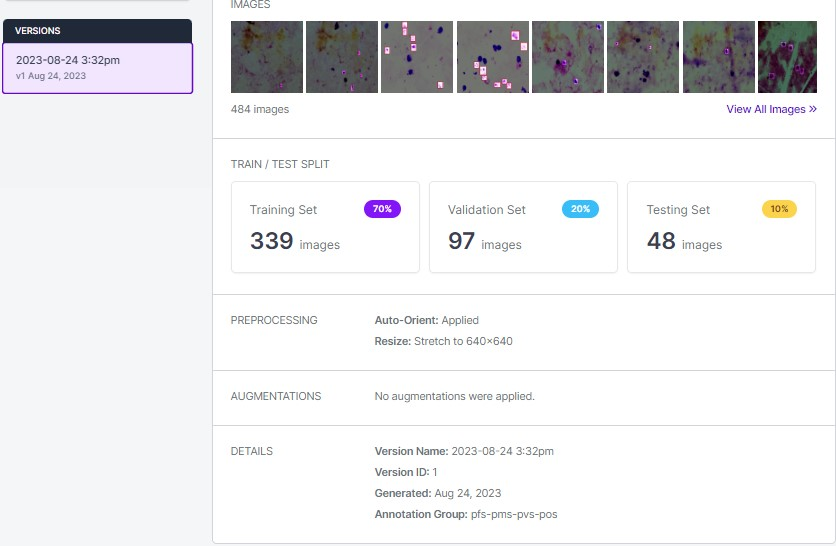
* Then Export the data set and Generate the link to it in roboflow.



In [30]:
# !pip install roboflow

# from roboflow import Roboflow
# rf = Roboflow(api_key="xuEgnRuYQVeSjjpfNcSS")
# project = rf.workspace("carnegie-mellon-university-c0qzd").project("parasite_detectorv7")
# dataset = project.version(1).download("yolov5")
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="xuEgnRuYQVeSjjpfNcSS")
project = rf.workspace("carnegie-mellon-university-c0qzd").project("parasite_detectorv8")
dataset = project.version(1).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to parasite_detectorv8-1 in yolov5pytorch:: 100%|██████████| 980/980 [00:06<00:00, 147.35it/s]


#3. Training the model using the train.py script and pass the following parameters:

**img**: define input image size


**epochs**: define the number of training epochs. (Note: often, 3000+ are common here!)

**data**: Our dataset locaiton is saved in the dataset.location

**weights**: specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.

In [31]:
!python train.py --img 640 --epochs 100 --data parasite_detectorv8-1/data.yaml --weights yolov5s.pt


train: weights=yolov5s.pt, cfg=, data=parasite_detectorv8-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-211-g94e943e Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, h

# Model Evaluation
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is mAP_0.5

In [34]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%reload_ext tensorboard

%tensorboard --logdir runs --port 6007

<IPython.core.display.Javascript object>

#Run Inference With Trained Weights on the test data set

In [36]:
!python detect.py --weights /content/YoloDrive/MyDrive/Mala_pjct/yolov5/runs/train/exp2/weights/best.pt --img 640 --conf 0.3 --source /content/YoloDrive/MyDrive/Mala_pjct/yolov5/parasite_detectorv7-1/test/images

detect: weights=['/content/YoloDrive/MyDrive/Mala_pjct/yolov5/runs/train/exp2/weights/best.pt'], source=/content/YoloDrive/MyDrive/Mala_pjct/yolov5/parasite_detectorv7-1/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-211-g94e943e Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/48 /content/YoloDrive/MyDrive/Mala_pjct/yolov5/parasite_detectorv7-1/test/images/pf_42_jpg.rf.1792ef582fe83672ddbf29365da1ee0e.jpg: 640x640 3 PVs, 11.5ms
image 2/48 /content/YoloDrive/MyDrive/Mala_pjct/yolov5/parasite_detectorv7-1/test/

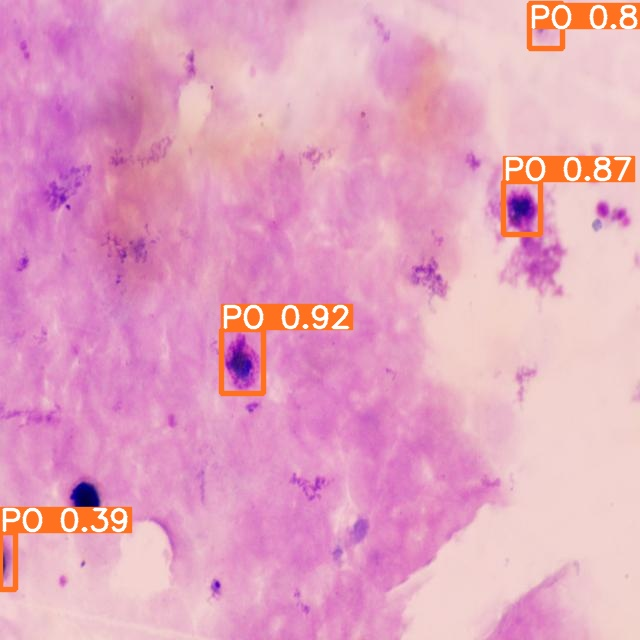

In [23]:
Image(filename='/content/YoloDrive/MyDrive/Mala_pjct/yolov5/runs/detect/exp2/po_165_jpg.rf.8070ce191da40cedb376a45bdb161dc4.jpg', height=400,width=1000)

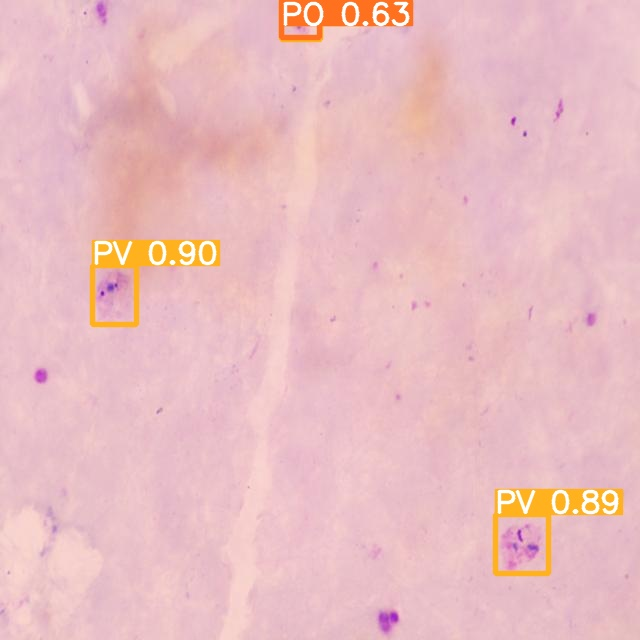

In [24]:

Image(filename='/content/YoloDrive/MyDrive/Mala_pjct/yolov5/runs/detect/exp2/pv_100_jpg.rf.4c989ca5cb760185f93b95a04b7737fd.jpg', height=400,width=1000)

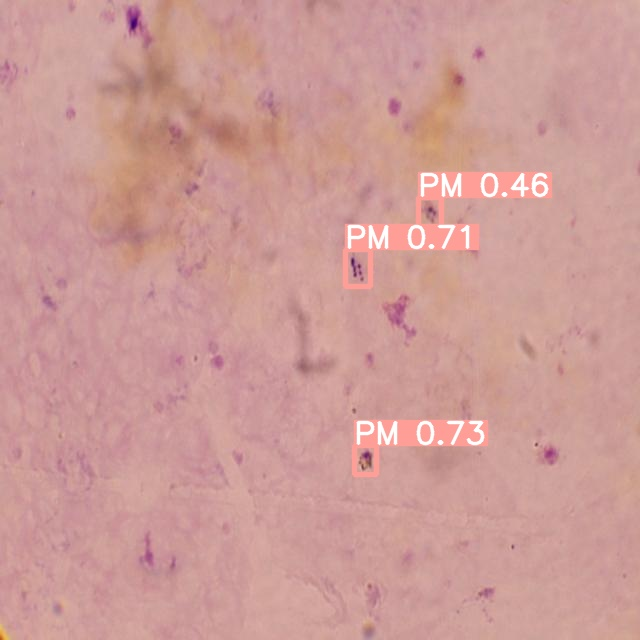

In [29]:

Image(filename='/content/YoloDrive/MyDrive/Mala_pjct/yolov5/runs/detect/exp2/pm_51_jpg.rf.f811d4971724294a373ac65869f9d0e4.jpg', height=400,width=1000)

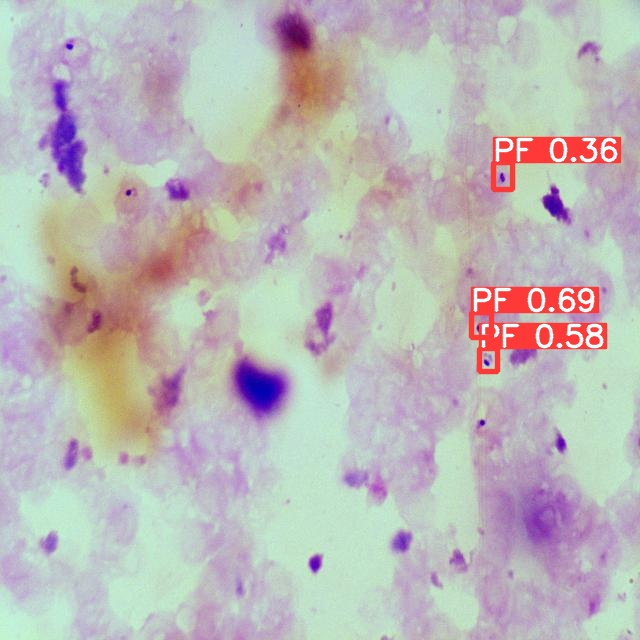

In [39]:

Image(filename='/content/YoloDrive/MyDrive/Mala_pjct/yolov5/runs/detect/exp3/pf_55_jpg.rf.fcd5096d34e5d53a14692ffbda2ca9ca.jpg', height=400,width=1000)

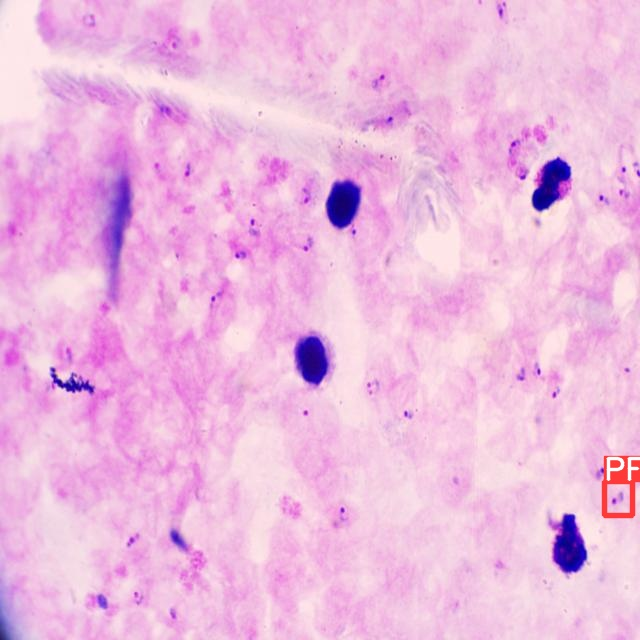

In [41]:
Image(filename='/content/YoloDrive/MyDrive/Mala_pjct/yolov5/runs/detect/exp4/pf_7_jpg.rf.954053c91c913d52f6e76c13f9d93e43.jpg', height=400,width=1000)